# Actividad Integradora
## Eduardo Rodríguez Gil - A01274913

## Descripción del problema 
¡Felicidades! Eres el orgulloso propietario de 5 robots nuevos y un almacén lleno de cajas. El dueño 
anterior del almacén lo dejó en completo desorden, por lo que depende de tus robots organizar las 
cajas en algo parecido al orden y convertirlo en un negocio exitoso.  
Cada  robot  está  equipado  con  ruedas  omnidireccionales  y,  por  lo  tanto,  puede  conducir  en  las 
cuatro direcciones. Pueden recoger cajas en celdas de cuadrícula adyacentes con sus 
manipuladores, luego llevarlas a otra ubicación e incluso construir pilas de hasta cinco cajas. Todos 
los robots están equipados con la tecnología de sensores más nueva que les permite recibir datos 
de sensores de las cuatro celdas adyacentes. Por tanto, es fácil distinguir si un campo está libre, es 
una pared, contiene una pila de cajas (y cuantas cajas hay en la pila) o está ocupado por otro robot. 
Los robots también tienen sensores de presión equipados que les indican si llevan una caja en ese 
momento.  
Lamentablemente,  tu  presupuesto  resultó  insuficiente  para  adquirir  un  software  de  gestión  de 
agentes múltiples de última generación. Pero eso no debería ser un gran problema ... ¿verdad? Tu 
tarea es enseñar a sus robots cómo ordenar su almacén. La organización de los agentes depende de 
ti, siempre que todas las cajas terminen en pilas ordenadas de cinco. 

## Reglas
#### Realiza la siguiente simulación: 
<br>
<li> Inicializa las posiciones iniciales de las K cajas. Todas las cajas están a nivel de piso, 
es decir, no hay pilas de cajas. 
<li> Todos los agentes empiezan en posición aleatorias vacías. 
<li> Se ejecuta el tiempo máximo establecido. 

#### Deberás recopilar la siguiente información durante la ejecución: 
<br>
<li> Tiempo necesario hasta que todas las cajas están en pilas de máximo 5 cajas. 
<li> Número de movimientos realizados por todos los robots. 
<li> Analiza si existe una estrategia que podría disminuir el tiempo dedicado, así como 
la cantidad de movimientos realizados. ¿Cómo sería? Descríbela. 

## Imports

Antes de empezar a crear el modelo de la actividad integradora con multiagentes es necesario tener instalado los siguientes paquetes:
- `python`: asegúrense de usar la versión 3+.
- `mesa`: el framework de Python para el modelado de agentes.
- `numpy`: es una biblioteca de Python para el manejo de matrices, arreglos, manipulación matemática, lógica y mucho más.
- `matplotlib`: es una biblioteca para crear visualizaciones estáticas, animadas e interactivas en Python.

Para poder modelar la actividad integradora usando el framework de `mesa` es necesario importar dos clases: una para el modelo general, y otro para los agentes.

In [1]:
# Importamos las clases que se requieren para manejar los agentes (Agent) y su entorno (Model).
# Cada modelo puede contener múltiples agentes.
from mesa import Agent, Model 

# Con ''RandomActivation, hacemos que todos los agentes se activen ''al azar''.
from mesa.time import RandomActivation

# Haremos uso de ''DataCollector'' para obtener información de cada paso de la simulación.
from mesa.datacollection import DataCollector

# matplotlib lo usaremos crear una animación de cada uno de los pasos del modelo.
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Importamos el siguiente paquete para generar números random.
import random

# Importamos los siguientes paquetes para el mejor manejo de valores numéricos.
import numpy as np
import pandas as pd

# Definimos otros paquetes que vamos a usar para medir el tiempo de ejecución de nuestro algoritmo.
import time
import datetime

In [2]:
""" Crea un agente de un robot con una posición inicial y una velocidad dada 
    donde se puede mover en varias direcciones."""
class BoxesAgent(Agent):
    """ Este agente representa una celda del modelo."""
    def __init__(self, unique_id, model, width, height, x, y):
        """ Crea un agente con un estado inicial aleatorio."""
        super().__init__(unique_id, model)
        self.width = width
        self.height = height
        self.same = True
        self.sort = False
        self.initial = np.array((x, y), dtype = int)
        self.velocity = np.array((0,0), dtype = int)
        
    def step(self):
        if self.same == False and self.sort == False:
            self.initial = self.initial + self.velocity
            
def BoxesModel(Model):
    """ Define nuestro modelo de la caja."""
    anw = []
    for agent_box in model.props.agents:
        anw.append(agent_box.initial)
    anw = np.asarray(anw)
    return anw

In [3]:
""" Crea un agente de un robot con una posición inicial y una velocidad dada 
    donde se puede mover en varias direcciones."""
class RobotsAgent(Agent):
    """ Este agente representa una celda del modelo."""
    def __init__(self, unique_id, model, width, height, x, y):
        """ Crea un agente con un estado inicial aleatorio."""
        super().__init__(unique_id, model)
        self.width = width
        self.height = height
        self.movent = 0
        self.move = ["E", "W", "N", "S"]
        self.this_box = None
        self.carry = False
        self.initial = np.array((x,y), dtype = int)
        self.robot = np.array((1,1), dtype = int)
        velocityX = np.random.randint(4)
        velocityY = np.random.randint(4)
        self.velocity = np.array((velocityX, velocityY), dtype = int)
        
    def step(self):
        """ Este método especifica que debe realizar el agente. En este caso, checa si el robot
            esta cargando una caja o si no esta caja.""" 
        self.see_area()
        self.move_robot()
        self.correct()
        
        if self.carry == True:
            self.get()
            self.charge()
            self.move_robot()
            self.this_box.velocity = self.velocity
            self.put()      
        
        else:
            self.moveBox()
            
        self.initial = self.initial + self.velocity
        self.movent += 1
        
    def see_area(self):
        """ Este método especifica que debe realizar el agente. En este caso, Revisa para
            que el robot no se salga de los limites.""" 
        self.move = ["E", "W", "N", "S"]

        if self.initial[0] >= self.width - 1:
            self.move.remove("E")
        elif self.initial[0] <= 1:
            self.move.remove("W")
            
        if self.initial[1] >= self.height - 1:
            self.move.remove("N")
        elif self.initial[1] <= 1:
            self.move.remove("S")
    
    # Permite que el robot se mueva de manera aleatoria
    def move_robot(self):
        """ Este método especifica que debe realizar el agente. En este caso, Hace que
            el robot se mueva de manera random en las direcciones que le indicamos.""" 
        displace = np.random.choice(self.move)
        if displace == 'E':
            self.E()
        elif displace == 'W':
            self.W()
        elif displace == 'N':
            self.N()
        elif displace == 'S':
            self.S()
            
    """ Este método especifica que debe realizar el agente. En este caso, que el
        robot se puede mover a la dirección de Este, Oeste, Norte y Sur."""
    def E(self): 
        self.velocity = np.array((1, 0), dtype = int)
        
    def W(self):
        self.velocity = np.array((-1, 0), dtype = int)
            
    def N(self): 
        self.velocity = np.array((0, 1), dtype = int)
        
    def S(self):
        self.velocity = np.array((0, -1), dtype = int)
            
    def moveBox(self):
        """ Este método especifica que debe realizar el agente. En este caso, el robot
            agarra una caja.""" 
        for box in model.props.agents:
            if self.initial[0] == box.initial[0] and self.initial[1] == box.initial[1] and box.sort == False:
                box.same = False
                box.velocity = self.velocity
                self.carry = True
                self.this_box = box
                
    """ Este método especifica que debe realizar el agente. En este caso, el robot
        coloca la caja en su correspondiente posición.""" 
    def put(self):
        if self.this_box.initial[0] == self.robot[0] and self.this_box.initial[1] == self.robot[1] and self.this_box.same == False:
            model.sort_box.append(self.this_box)
            self.this_box.same = True
            self.this_box.sort = True
            self.carry = False
            self.this_box = None
    
    def correct(self):
        """ Este método especifica que debe realizar el agente. En este caso, checa donde
            se va a dejar la caja sea correcta.""" 
        for box in model.sort_box:
            if box.initial[1] == self.robot[1] and box.initial[0] == self.robot[0]:
                self.robot[1] += 1
        if self.robot[1] > 5:
            self.robot[0] += 2
            self.robot[1] = 1

    def get(self):
        """ Este método especifica que debe realizar el agente. En este caso, el robot
            se dirige hacia el Norte para poder acomodar las cajas.""" 
        if self.initial[1] < self.height - 1:
            self.move = ["N"]
            
    def charge(self):
        """ Este método especifica que debe realizar el agente. En este caso, el robot
             sigue una dirreción.""" 
        if self.initial[1] == self.height - 1 and 1 <= self.initial[0] < self.width - 1:
            self.move = ["E"]
        elif self.initial[1] == self.robot[1] and self.robot[0] <= self.initial[0] <= self.width - 1:
            self.move = ["W"]
        elif self.initial[0] == self.width - 1 and self.robot[1] < self.initial[1] <= self.height - 1:
            self.move = ["S"]
                
def RobotsModel(Model):
    """ Define nuestro modelo del robot."""
    anw = []
    for agent_robot in model.schedule.agents:
        anw.append(agent_robot.initial)
    anw = np.asarray(anw)
    return anw

class FormModel(Model):
    """ Define nuestro modelo, los agentes y su entorno."""
    def __init__(self, Robots, width, height, K):
        self.boxes = K
        self.robots = Robots
        self.sort_box = []
        self.organize = False
        self.props = RandomActivation(self)
        self.schedule = RandomActivation(self)
        i = 0
        t = []
        while i in range(K):
            x = np.random.randint(1, width - 1)
            y = np.random.randint(2, height - 1)
            p = [x,y]
            if p in t:
                continue
            box = BoxesAgent(i, self, width, height, x, y)
            self.props.add(box)
            t.append(p)
            i += 1
            
        i = 0
        while i in range(self.robots):
            x = np.random.randint(1, width - 1)
            y = np.random.randint(1, height - 1)
            p = [x, y]
            if p in t:
                continue
            robot = RobotsAgent(i, self, width, height, x, y)
            self.schedule.add(robot)
            t.append(p)
            i += 1
            
        # Aquí definimos el recolector para obtener el grid completo.
        self.datacollector = DataCollector(model_reporters = {"Robot" : RobotsModel, "Box" : BoxesModel})
            
    def step(self):
        """ Ejecuta un paso de la simulación."""
        self.datacollector.collect(self)
        self.schedule.step()
        self.props.step()
        if len(self.sort_box) == self.boxes:
            self.organize = True
        
    def movent(self):
        total = 0
        for agent in model.schedule.agents:
            total += agent.movent
        return total

In [16]:
# Definimos el tamaño.
W = 20
H = 20
K = 8

# Definimos el número de robots.
Robots = 5

# Registramos el tiempo de inicio y ejecutamos la simulación.
start_time = time.time()
model = FormModel(Robots, W, H, K)
ite = 0
while model.organize == False:
    model.step()
    ite += 1
movents = model.movent()    

In [17]:
W = 15
H = 15
K = 10
Robots = 5
# Definimos el número máximo de iteraciones a correr
iterations = 1000

model = FormModel(Robots, W, H, K)
for i in range(iterations):
    model.step()

In [18]:
# Obtenemos la información que almacenó el colector, este nos entregará un DataFrame de pandas que contiene toda la información.
all_initial = model.datacollector.get_model_vars_dataframe()

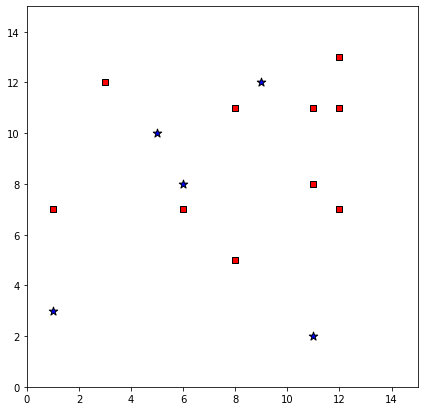

In [19]:
# Graficamos la información usando `matplotlib`
#%%capture

fig, axs = plt.subplots(figsize=(7,7))
scatter = axs.scatter(all_initial.iloc[0][0][:,0], all_initial.iloc[0][0][:,1], 
                  s=80, cmap="jet", edgecolor="k",  marker="*", color = "b")

boxes = axs.scatter(all_initial.iloc[0][1][:,0], all_initial.iloc[0][1][:,1], 
                  s=40, cmap="jet", edgecolor="k", marker="s", color="r")


axs.axis([0, W, 0, H])
def update(frame_number):
    scatter.set_offsets(all_initial.iloc[frame_number][0])
    boxes.set_offsets(all_initial.iloc[frame_number][1])
    return scatter

anim = animation.FuncAnimation(fig, update, frames=iterations)

In [20]:
# Imprimimos el tiempo que le tomó correr al modelo.
print('Tiempo máximo de ejecución:', str(datetime.timedelta(seconds=(time.time() - start_time))))

# Imprimimos el número de movimientos realizados por todos los robots.
print("Número de movimientos realizados por todos los robots:" + str(movents))

# Imprimimos la cantidad de movimientos realizados.
print("Cantidad de movimientos realizados:" + str(ite))

Tiempo máximo de ejecución: 0:00:02.092846
Número de movimientos realizados por todos los robots:2680
Cantidad de movimientos realizados:536


In [21]:
anim

## Resultados
Como podemos obsevar en algunas situaciones la simulación llega a tardar más de lo debido, lo cual podemos optimizar utilizando algo más moderno con más recursos como con la nuevo de las bases y análisis de los datos.